In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV


In [3]:
data=pd.read_excel('dataset12.xlsx')
data.drop('Unnamed: 0',axis=1,inplace=True)

In [8]:
# Check for non-numeric columns and encode them
non_numeric_columns = data.select_dtypes(include=['object']).columns
label_encoders = {}
for col in non_numeric_columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col].astype(str))
    label_encoders[col] = le

# Separate features (X) and target (y)
X = data.drop(columns=['decision'])  # Drop the target column to keep only features
y = data['decision']  # Use the target column

# If the target variable is continuous, binarize or categorize it
if y.dtypes in ['float64', 'int64'] and len(y.unique()) > 10:  # Continuous target
    y = pd.cut(y, bins=2, labels=[0, 1])  # Example: Binarizing into 2 classes

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Dictionary to store models and their parameters
models = {
    'Logistic Regression': {
        'model': LogisticRegression(max_iter=1000, random_state=42),
        'params': {'C': [0.01, 0.1, 1, 10, 100]}
    },
    'Decision Tree': {
        'model': DecisionTreeClassifier(random_state=42),
        'params': {'max_depth': [None, 5, 10, 20], 'min_samples_split': [2, 5, 10]}
    },
    'Random Forest': {
        'model': RandomForestClassifier(random_state=42),
        'params': {'n_estimators': [50, 100, 200], 'max_depth': [None, 5, 10, 20]}
    },
    'XGBoost': {
        'model': XGBClassifier(eval_metric='logloss', random_state=42),
        'params': {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5, 10]}
    }
}

# Iterate through each model, perform GridSearchCV, and evaluate the best model
results = {}
for model_name, config in models.items():
    print(f"Training {model_name}...")
    grid = GridSearchCV(config['model'], config['params'], cv=5, scoring='roc_auc', n_jobs=-1)
    grid.fit(X_train, y_train)

    # Get the best model and evaluate on test set
    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test)
    y_pred_proba = best_model.predict_proba(X_test)[:, 1] if hasattr(best_model, 'predict_proba') else None

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else 'N/A'

    results[model_name] = {
        'Best Params': grid.best_params_,
        'Accuracy': accuracy,
        'ROC AUC': roc_auc
    }

for model_name, metrics in results.items():
    print(f"\nModel: {model_name}")
    print(f"Best Parameters: {metrics['Best Params']}")
    print(f"Accuracy: {metrics['Accuracy']}")
    print(f"ROC AUC: {metrics['ROC AUC']}")


Training Logistic Regression...
Training Decision Tree...
Training Random Forest...
Training XGBoost...

Model: Logistic Regression
Best Parameters: {'C': 100}
Accuracy: 0.7700787401574803
ROC AUC: 0.8476350144835523

Model: Decision Tree
Best Parameters: {'max_depth': 5, 'min_samples_split': 10}
Accuracy: 0.8015748031496063
ROC AUC: 0.9059511527320343

Model: Random Forest
Best Parameters: {'max_depth': 20, 'n_estimators': 200}
Accuracy: 0.8598425196850393
ROC AUC: 0.955344033966906

Model: XGBoost
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Accuracy: 0.878740157480315
ROC AUC: 0.9698325463275268


Accuracy: 0.8772, ROC AUC: 0.9670


 95%|=================== | 2418/2539 [00:18<00:00]       

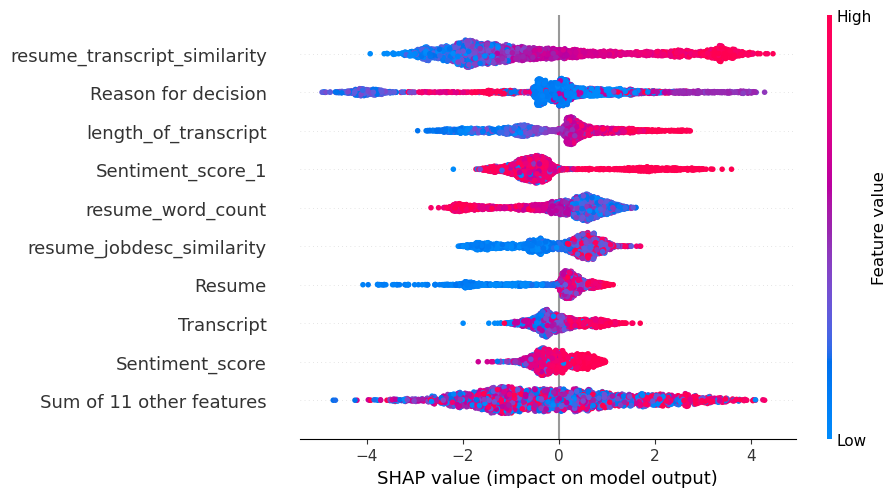

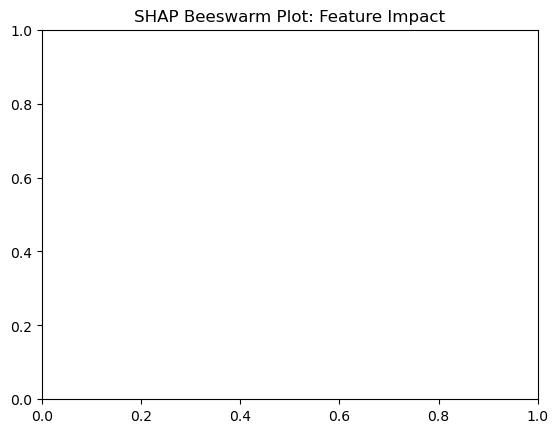

Top 3 features based on SHAP values: ['length_of_transcript' 'Reason for decision'
 'resume_transcript_similarity']


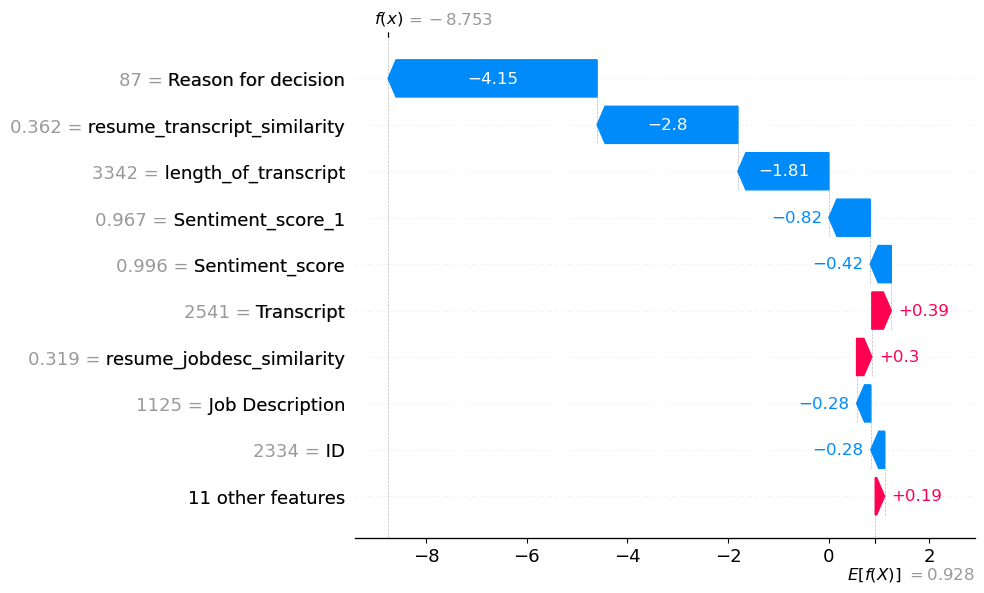

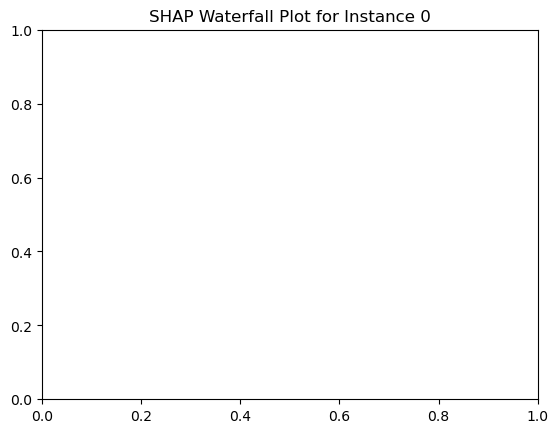

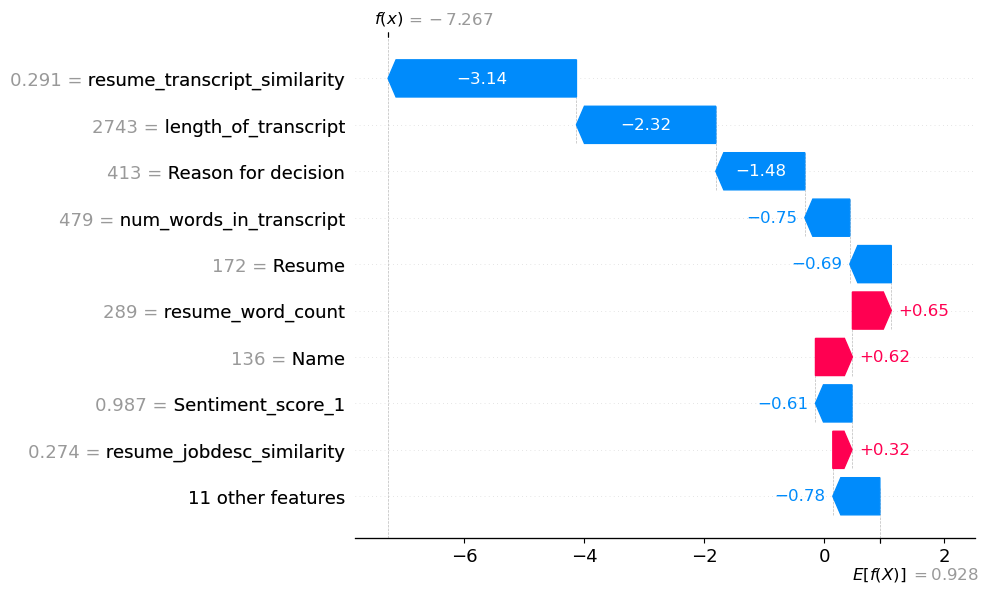

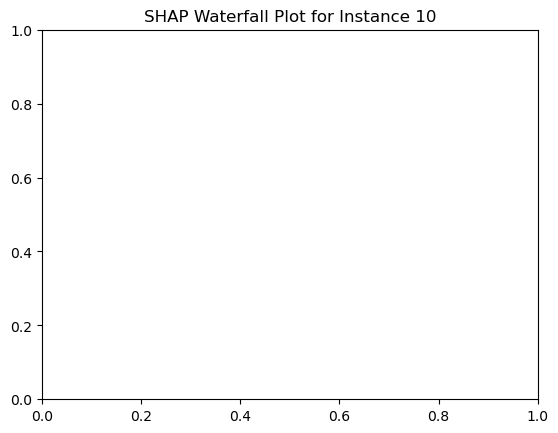

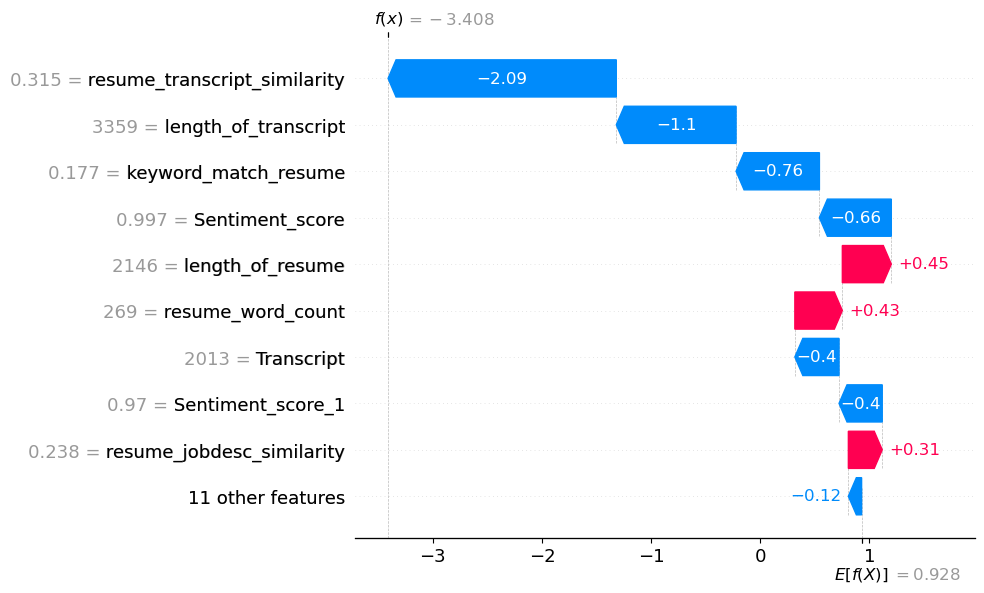

...

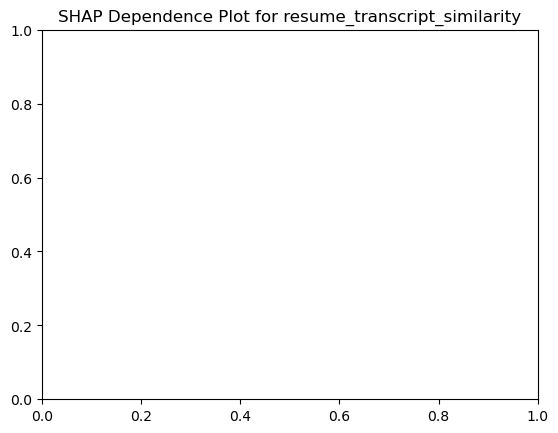

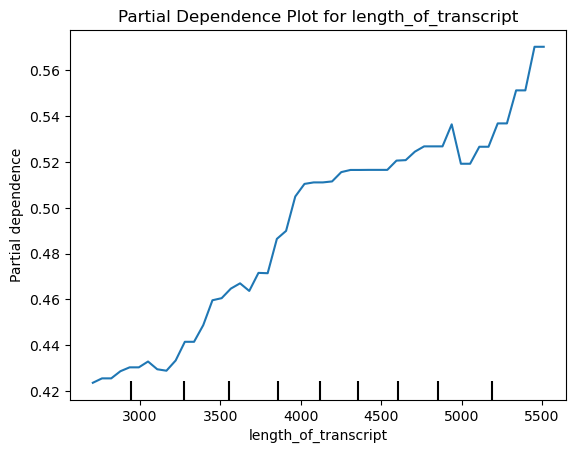

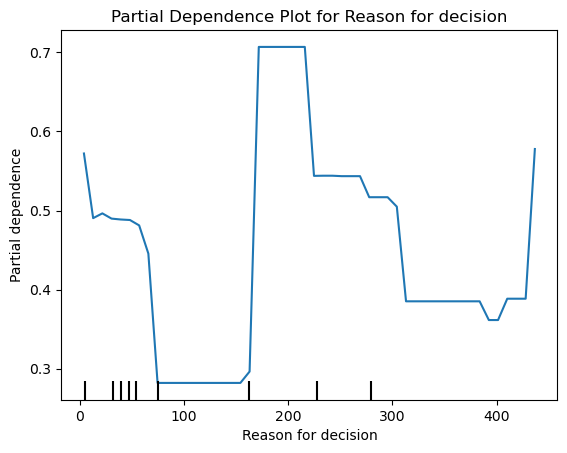

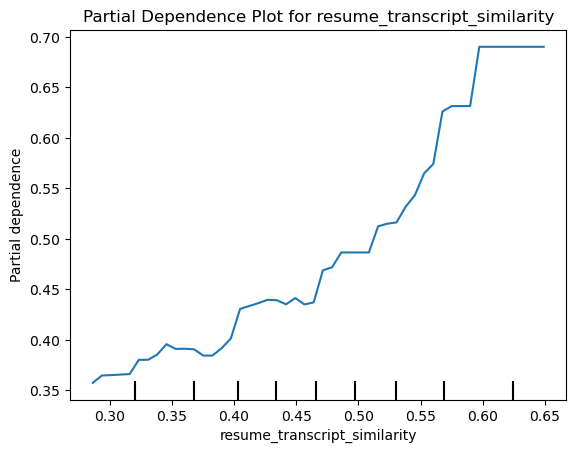

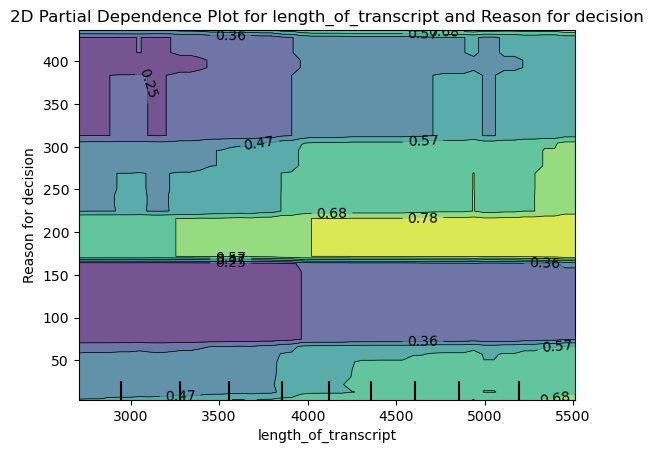

Base Value (Expected Log-Odds): 0.9277642979150889
Instance 0 Probability: 0.0002
Instance 10 Probability: 0.0007
Instance 20 Probability: 0.0320


In [9]:
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import LabelEncoder
import shap
from sklearn.inspection import PartialDependenceDisplay
non_numeric_columns = data.select_dtypes(include=['object']).columns
label_encoders = {}
for col in non_numeric_columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col].astype(str))
    label_encoders[col] = le

# Separate features (X) and target (y)
X = data.drop(columns=['decision'])  # Replace 'decision' with your target column name
y = data['decision']

# Binarize target if necessary
if y.dtypes in ['float64', 'int64'] and len(y.unique()) > 10:  # Continuous target
    y = pd.cut(y, bins=2, labels=[0, 1])  # Example: Binarizing into 2 classes

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = xgb.XGBClassifier(eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Evaluate model
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"Accuracy: {accuracy:.4f}, ROC AUC: {roc_auc:.4f}")

# SHAP Analysis
explainer = shap.Explainer(xgb_model, X_train)
shap_values = explainer(X_train)

# 1. SHAP Beeswarm Plot
shap.plots.beeswarm(shap_values)
plt.title("SHAP Beeswarm Plot: Feature Impact")
plt.show()

# Identify top 3 features based on mean absolute SHAP values
top_features = np.array(X_train.columns)[np.argsort(np.abs(shap_values.values).mean(axis=0))[-3:]]
print(f"Top 3 features based on SHAP values: {top_features}")

# 2. SHAP Waterfall Plots
for instance_idx in [0, 10, 20]:  # Example indices
    shap_value = shap_values[instance_idx]
    shap.plots.waterfall(shap_value)
    plt.title(f"SHAP Waterfall Plot for Instance {instance_idx}")
    plt.show()

# 3. SHAP Dependence Plots for Top 3 Features
for feature_name in top_features:
    shap.plots.scatter(shap_values[:, feature_name], color=shap_values)
    plt.title(f"SHAP Dependence Plot for {feature_name}")
    plt.show()

# 4. Partial Dependence Plots (PDPs)
for feature_name in top_features:
    PartialDependenceDisplay.from_estimator(
        xgb_model, X_train, [feature_name], grid_resolution=50, kind='average'
    )
    plt.title(f"Partial Dependence Plot for {feature_name}")
    plt.show()

# 5. 2D Partial Dependence Plot for Interaction
PartialDependenceDisplay.from_estimator(
    xgb_model, X_train, [(top_features[0], top_features[1])], grid_resolution=50
)
plt.title(f"2D Partial Dependence Plot for {top_features[0]} and {top_features[1]}")
plt.show()

# 6. Convert SHAP values to probabilities
base_value = explainer.expected_value
print(f"Base Value (Expected Log-Odds): {base_value}")
for instance_idx in [0, 10, 20]:
    shap_log_odds = base_value + shap_values.values[instance_idx].sum()
    shap_prob = 1 / (1 + np.exp(-shap_log_odds))
    print(f"Instance {instance_idx} Probability: {shap_prob:.4f}")


In [10]:
import pickle
with open('xgboost_model.pkl', 'wb') as file:
    pickle.dump(xgb_model, file)


Basic Information about the Dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3174 entries, 0 to 3173
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   ID                             3174 non-null   int32  
 1   Name                           3174 non-null   int32  
 2   Role                           3174 non-null   int32  
 3   Transcript                     3174 non-null   int32  
 4   Resume                         3174 non-null   int32  
 5   decision                       3174 non-null   int32  
 6   Reason for decision            3174 non-null   int32  
 7   Job Description                3174 non-null   int32  
 8   length_of_transcript           3174 non-null   int64  
 9   num_words_in_transcript        3174 non-null   int64  
 10  resume_word_count              3174 non-null   int64  
 11  Sentiment_score                3174 non-null   float64
 12  Sentiment

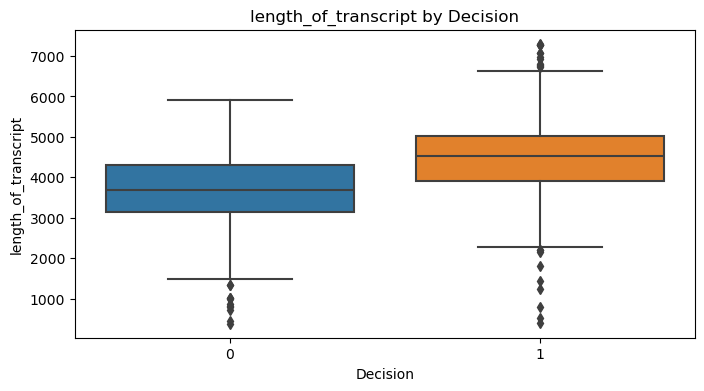

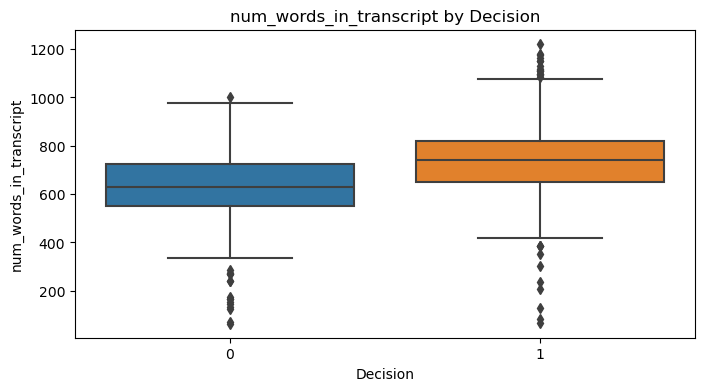

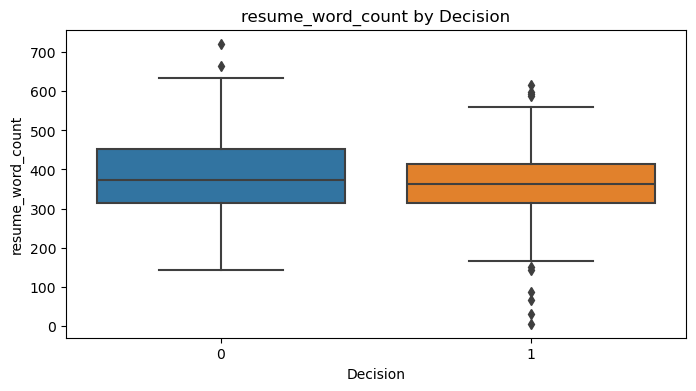

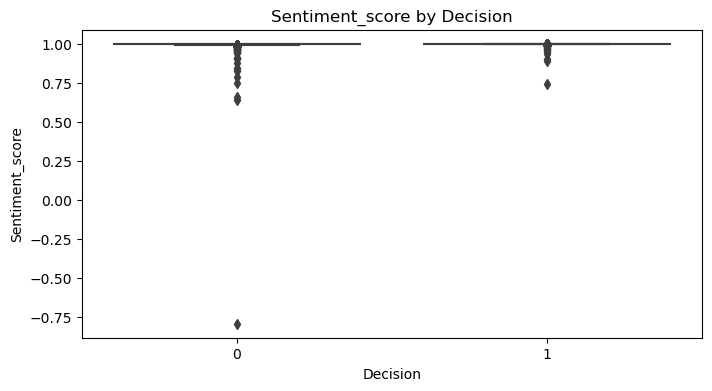

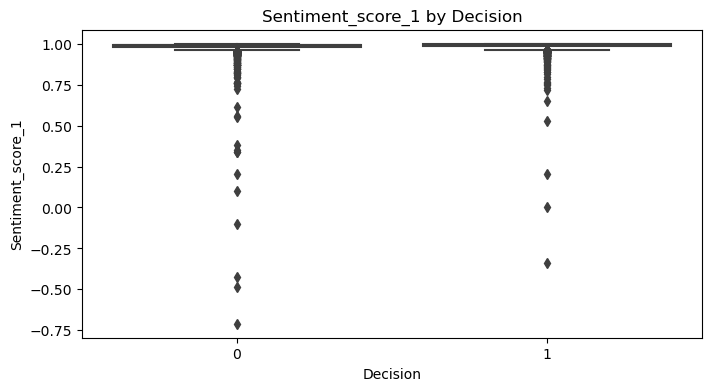

...

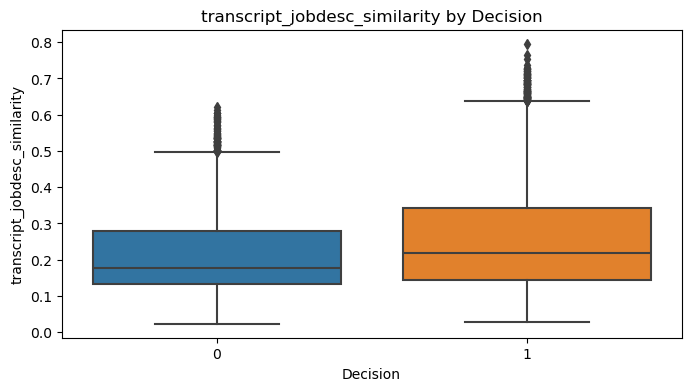

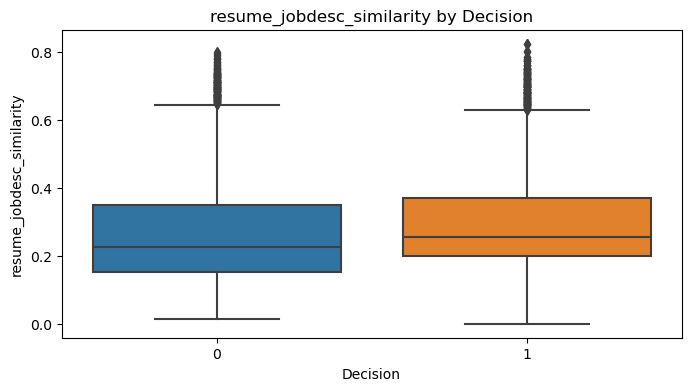

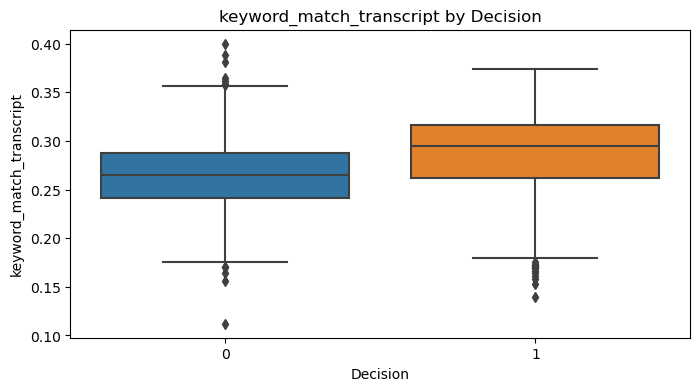

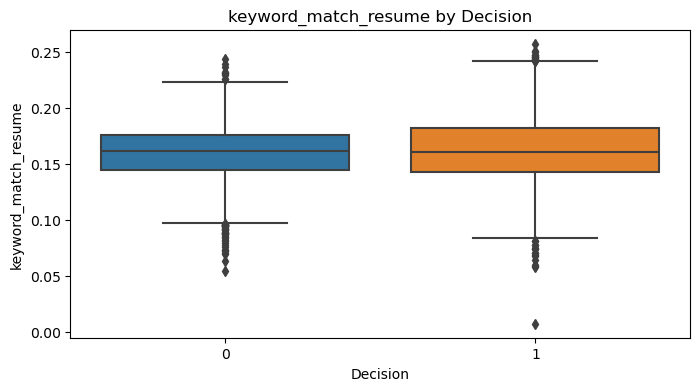

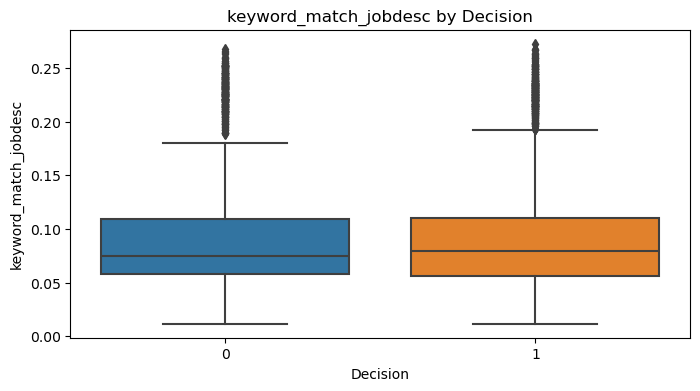

C:\Users\Rishy\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Rishy\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Rishy\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Rishy\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

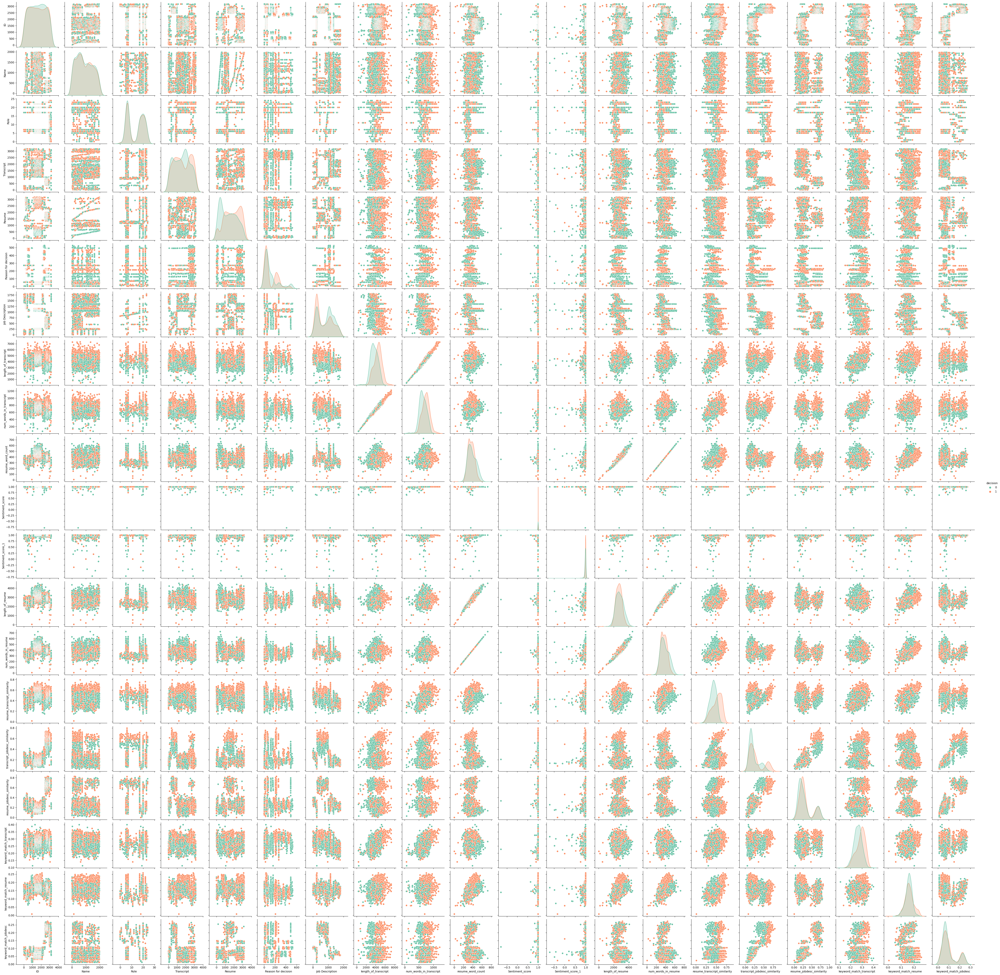

Accuracy: 0.8772, ROC AUC: 0.9670


 97%|=================== | 2459/2539 [00:18<00:00]       

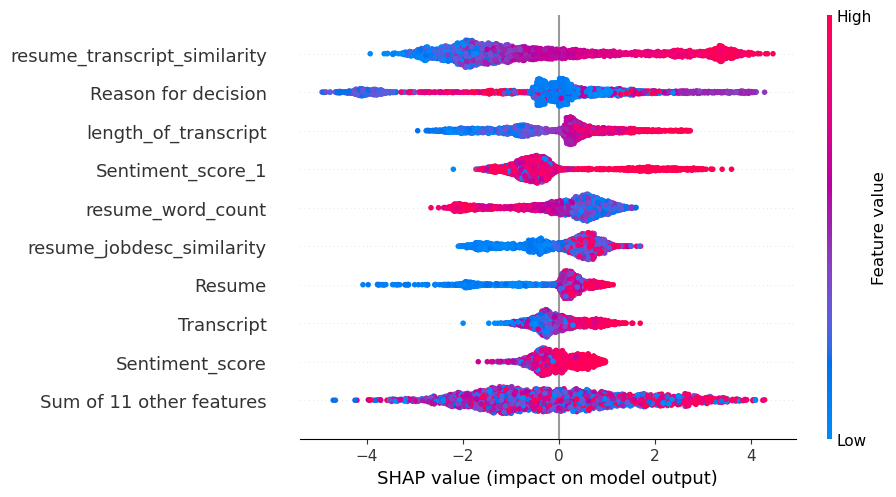

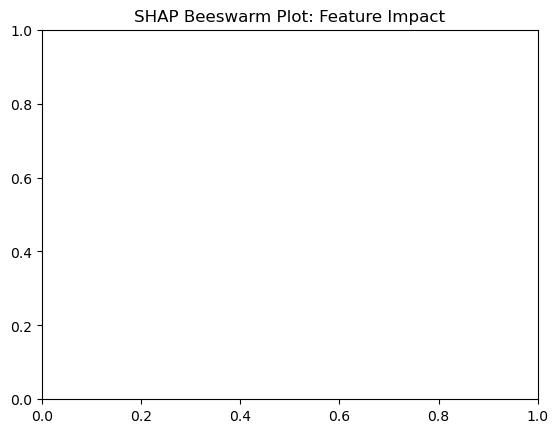

Top 3 features based on SHAP values: ['length_of_transcript' 'Reason for decision'
 'resume_transcript_similarity']


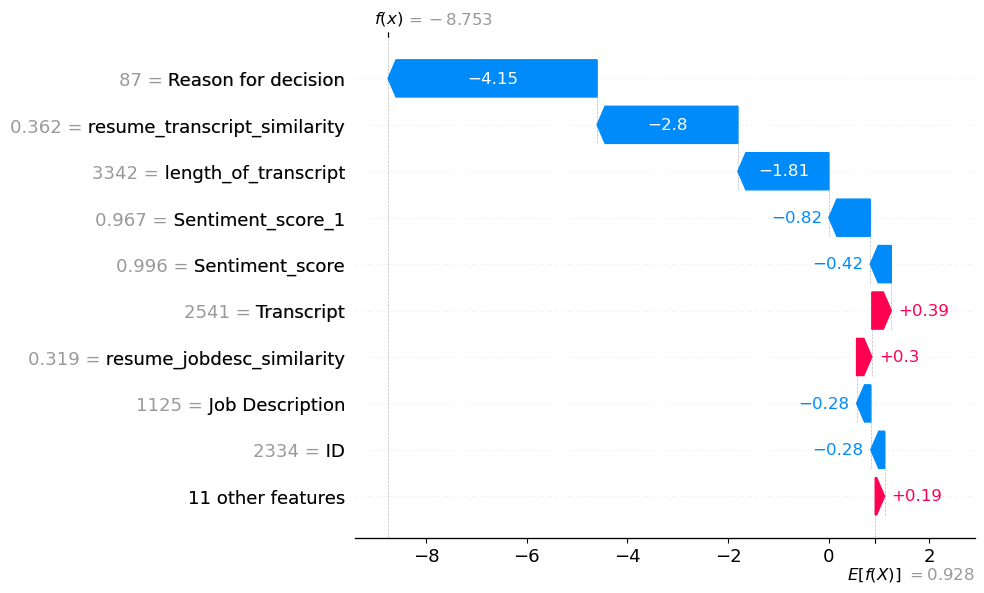

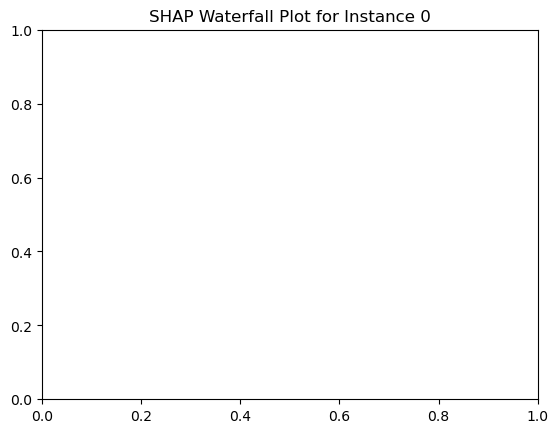

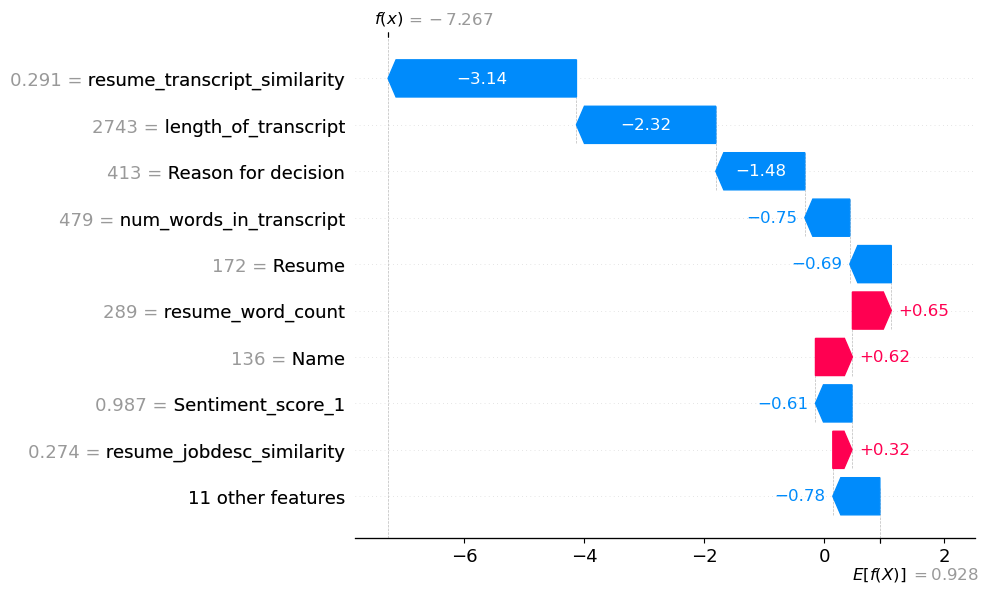

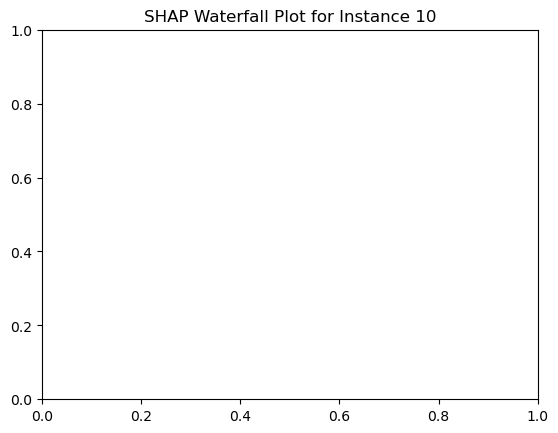

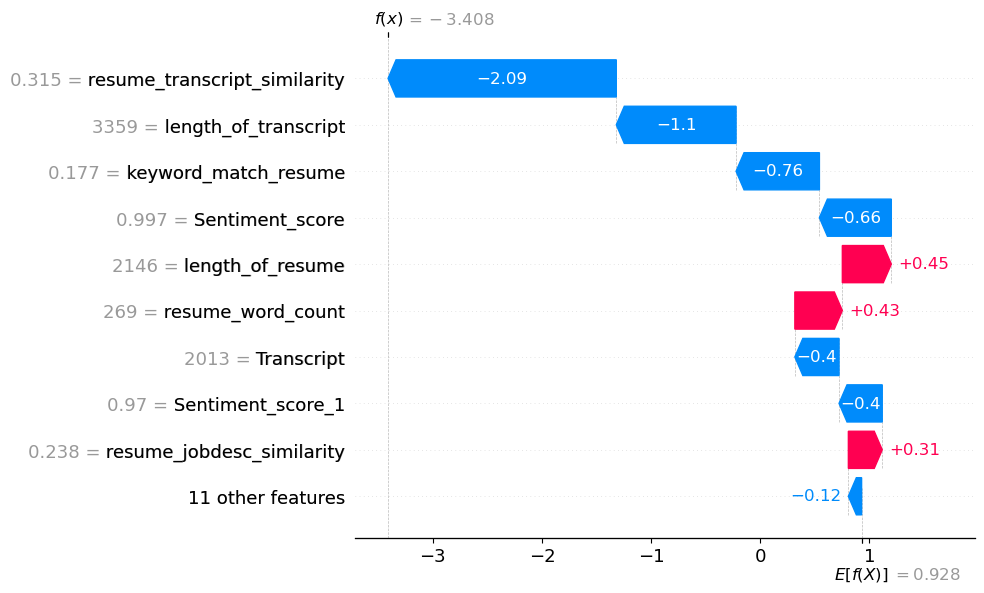

...

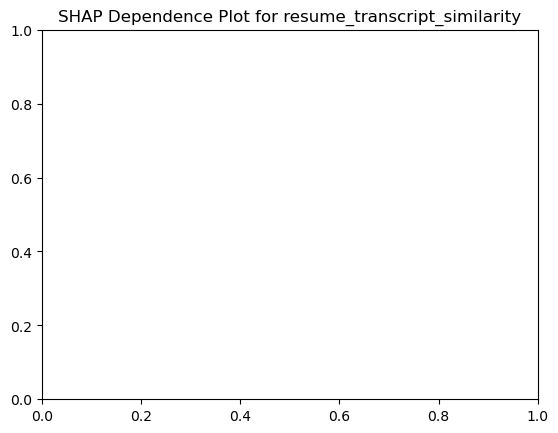

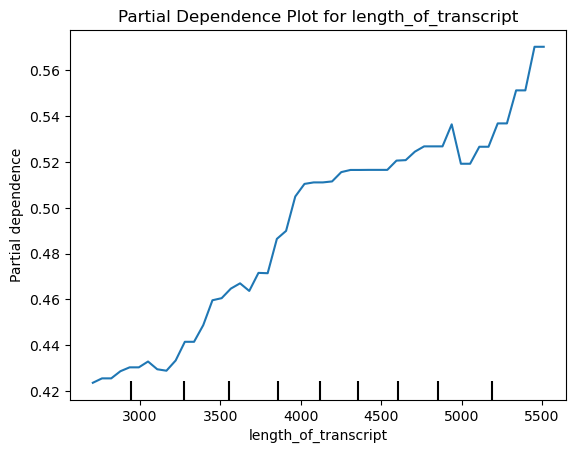

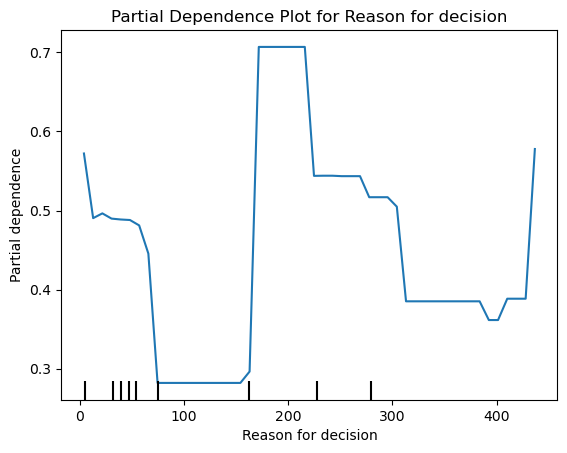

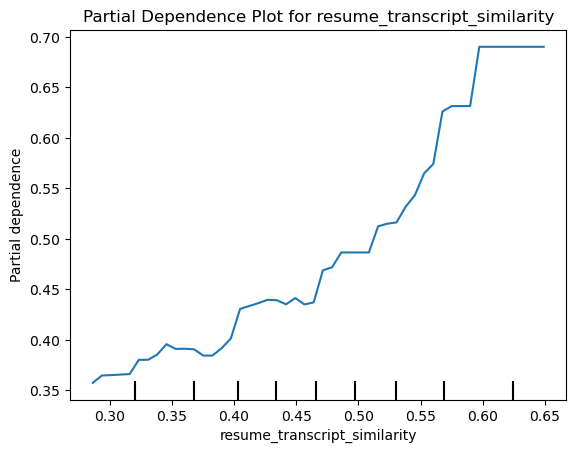

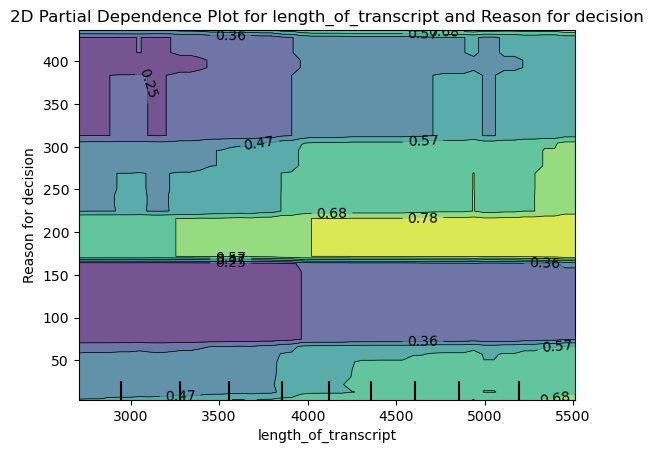

Base Value (Expected Log-Odds): 0.9277642979150889
Instance 0 Probability: 0.0002
Instance 10 Probability: 0.0007
Instance 20 Probability: 0.0320

EDA and Model Analysis Complete!


In [11]:
# Enhanced Exploratory Data Analysis (EDA) and XGBoost Model with SHAP Analysis

# Step 1: Load Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import LabelEncoder
import shap
from sklearn.inspection import PartialDependenceDisplay

# Step 2: Load the Dataset


# Step 3: Basic Overview of the Data
print("\nBasic Information about the Dataset:\n")
data.info()
print("\nDataset Shape:", data.shape)
print("\nFirst 5 Rows:\n", data.head())

# Step 4: Visualizations with Respect to Output (Decision)
# 4.1 Distribution of Numerical Features by Decision
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=data, x='decision', y=col)
    plt.title(f'{col} by Decision')
    plt.xlabel('Decision')
    plt.ylabel(col)
    plt.show()

# 4.2 Count of Categorical Features by Decision
categorical_cols = data.select_dtypes(include=['object']).columns
for col in categorical_cols:
    if col != 'decision':  # Exclude the target column itself
        plt.figure(figsize=(8, 4))
        sns.countplot(data=data, x=col, hue='decision', order=data[col].value_counts().index)
        plt.title(f'{col} Distribution by Decision')
        plt.xticks(rotation=45)
        plt.show()

# 4.3 Pair Plot by Decision
sns.pairplot(data, hue='decision', diag_kind='kde', palette='Set2')
plt.show()

# Step 5: Preprocessing
non_numeric_columns = data.select_dtypes(include=['object']).columns
label_encoders = {}
for col in non_numeric_columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col].astype(str))
    label_encoders[col] = le

# Separate features (X) and target (y)
X = data.drop(columns=['decision'])  # Replace 'decision' with your target column name
y = data['decision']

# Binarize target if necessary
if y.dtypes in ['float64', 'int64'] and len(y.unique()) > 10:  # Continuous target
    y = pd.cut(y, bins=2, labels=[0, 1])  # Example: Binarizing into 2 classes

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 6: Train XGBoost Model
xgb_model = xgb.XGBClassifier(eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Evaluate model
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"Accuracy: {accuracy:.4f}, ROC AUC: {roc_auc:.4f}")

# Step 7: SHAP Analysis
explainer = shap.Explainer(xgb_model, X_train)
shap_values = explainer(X_train)

# 7.1 SHAP Beeswarm Plot
shap.plots.beeswarm(shap_values)
plt.title("SHAP Beeswarm Plot: Feature Impact")
plt.show()

# Identify top 3 features based on mean absolute SHAP values
top_features = np.array(X_train.columns)[np.argsort(np.abs(shap_values.values).mean(axis=0))[-3:]]
print(f"Top 3 features based on SHAP values: {top_features}")

# 7.2 SHAP Waterfall Plots
for instance_idx in [0, 10, 20]:  # Example indices
    shap_value = shap_values[instance_idx]
    shap.plots.waterfall(shap_value)
    plt.title(f"SHAP Waterfall Plot for Instance {instance_idx}")
    plt.show()

# 7.3 SHAP Dependence Plots for Top 3 Features
for feature_name in top_features:
    shap.plots.scatter(shap_values[:, feature_name], color=shap_values)
    plt.title(f"SHAP Dependence Plot for {feature_name}")
    plt.show()

# 7.4 Partial Dependence Plots (PDPs)
for feature_name in top_features:
    PartialDependenceDisplay.from_estimator(
        xgb_model, X_train, [feature_name], grid_resolution=50, kind='average'
    )
    plt.title(f"Partial Dependence Plot for {feature_name}")
    plt.show()

# 7.5 2D Partial Dependence Plot for Interaction
PartialDependenceDisplay.from_estimator(
    xgb_model, X_train, [(top_features[0], top_features[1])], grid_resolution=50
)
plt.title(f"2D Partial Dependence Plot for {top_features[0]} and {top_features[1]}")
plt.show()

# 7.6 Convert SHAP values to probabilities
base_value = explainer.expected_value
print(f"Base Value (Expected Log-Odds): {base_value}")
for instance_idx in [0, 10, 20]:
    shap_log_odds = base_value + shap_values.values[instance_idx].sum()
    shap_prob = 1 / (1 + np.exp(-shap_log_odds))
    print(f"Instance {instance_idx} Probability: {shap_prob:.4f}")

# Conclusion
print("\nEDA and Model Analysis Complete!")


In [6]:
import pandas as pd
from transformers import DistilBertTokenizer, DistilBertModel
import torch
from sklearn.metrics.pairwise import cosine_similarity

# Load the dataset
data_path = "/data3.xlsx"
data = pd.read_excel(data_path)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load DistilBERT model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
model = DistilBertModel.from_pretrained("distilbert-base-uncased").to(device)  # Move model to GPU

# Function to get BERT embeddings
def get_bert_embeddings_batch(texts, tokenizer, model, batch_size=8):
    all_embeddings = []
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i + batch_size]
        inputs = tokenizer(batch, return_tensors='pt', truncation=True, padding=True, max_length=512)
        inputs = {key: value.to(device) for key, value in inputs.items()}  # Move inputs to GPU
        with torch.no_grad():
            outputs = model(**inputs)
        embeddings = outputs.last_hidden_state.mean(dim=1)  # Use mean pooling
        all_embeddings.append(embeddings)
    return torch.cat(all_embeddings, dim=0)


# Function to calculate similarity scores
def calculate_similarity(emb1, emb2):
    return cosine_similarity(emb1.cpu().numpy(), emb2.cpu().numpy())  # Move embeddings back to CPU for similarity calculation

# Extract relevant text columns
transcripts = data['Transcript'].tolist()
resumes = data['Resume'].tolist()
job_descriptions = data['Job Description'].tolist()

# Get embeddings for transcripts, resumes, and job descriptions
print("Generating embeddings for transcripts...")
transcript_embeddings = get_bert_embeddings_batch(transcripts, tokenizer, model, batch_size=4)
print("Generating embeddings for resumes...")
resume_embeddings = get_bert_embeddings_batch(resumes, tokenizer, model, batch_size=4)
print("Generating embeddings for job descriptions...")
jobdesc_embeddings = get_bert_embeddings_batch(job_descriptions, tokenizer, model, batch_size=4)

# Calculate similarity scores
print("Calculating similarity scores...")
data['transcript_resume_similarity'] = calculate_similarity(transcript_embeddings, resume_embeddings).diagonal()
data['transcript_jobdesc_similarity'] = calculate_similarity(transcript_embeddings, jobdesc_embeddings).diagonal()
data['resume_jobdesc_similarity'] = calculate_similarity(resume_embeddings, jobdesc_embeddings).diagonal()

# Save results to a new Excel file
output_path = "processed_data3.xlsx"
data.to_excel(output_path, index=False)
print(f"Processed data saved to {output_path}")

# Example analysis: correlation of similarity scores with decisions
data['decision_binary'] = data['decision'].apply(lambda x: 1 if x.lower() == 'selected' else 0)
correlations = data[['transcript_resume_similarity', 'transcript_jobdesc_similarity', 'resume_jobdesc_similarity', 'decision_binary']].corr()
print("Feature correlations:\n", correlations)


Generating embeddings for transcripts...
Generating embeddings for resumes...
Generating embeddings for job descriptions...
Calculating similarity scores...
Processed data saved to processed_data3.xlsx
Feature correlations:
                                transcript_resume_similarity  \
transcript_resume_similarity                       1.000000   
transcript_jobdesc_similarity                     -0.281992   
resume_jobdesc_similarity                         -0.328129   
decision_binary                                    0.260319   

                               transcript_jobdesc_similarity  \
transcript_resume_similarity                       -0.281992   
transcript_jobdesc_similarity                       1.000000   
resume_jobdesc_similarity                           0.909304   
decision_binary                                     0.130682   

                               resume_jobdesc_similarity  decision_binary  
transcript_resume_similarity                   -0.328129      

In [11]:
import pandas as pd
from transformers import DistilBertTokenizer, DistilBertModel
import torch
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score

# Load the dataset
data_path = "/data3.xlsx"
data = pd.read_excel(data_path)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load DistilBERT model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
model = DistilBertModel.from_pretrained("distilbert-base-uncased").to(device)  # Move model to GPU

# Function to get BERT embeddings with progress monitoring
def get_bert_embeddings_batch(texts, tokenizer, model, batch_size=8):
    all_embeddings = []
    total_batches = (len(texts) + batch_size - 1) // batch_size
    print(f"Total Batches: {total_batches}")

    for i in range(0, len(texts), batch_size):
        print(f"Processing batch {i // batch_size + 1}/{total_batches}...")
        batch = texts[i:i + batch_size]
        inputs = tokenizer(batch, return_tensors='pt', truncation=True, padding=True, max_length=512)
        inputs = {key: value.to(device) for key, value in inputs.items()}  # Move inputs to GPU
        with torch.no_grad():
            outputs = model(**inputs)
        embeddings = outputs.last_hidden_state[:, 0, :].cpu()  # Use [CLS] token representation
        all_embeddings.append(embeddings)
    return torch.cat(all_embeddings, dim=0)

# Extract text columns
transcripts = data['Transcript'].tolist()
resumes = data['Resume'].tolist()
job_descriptions = data['Job Description'].tolist()

# Generate embeddings
print("Generating embeddings for transcripts...")
transcript_embeddings = get_bert_embeddings_batch(transcripts, tokenizer, model, batch_size=4)
print("Generating embeddings for resumes...")
resume_embeddings = get_bert_embeddings_batch(resumes, tokenizer, model, batch_size=4)
print("Generating embeddings for job descriptions...")
jobdesc_embeddings = get_bert_embeddings_batch(job_descriptions, tokenizer, model, batch_size=4)

# Convert embeddings into DataFrame columns
def expand_embeddings(embeddings, prefix):
    df = pd.DataFrame(embeddings.numpy())
    df.columns = [f"{prefix}_emb_{i}" for i in range(df.shape[1])]
    return df

transcript_df = expand_embeddings(transcript_embeddings, "transcript")
resume_df = expand_embeddings(resume_embeddings, "resume")
jobdesc_df = expand_embeddings(jobdesc_embeddings, "jobdesc")

# Combine expanded embeddings with original data
data = pd.concat([data, transcript_df, resume_df, jobdesc_df], axis=1)

# Prepare features and target
label_encoder = LabelEncoder()
data['decision_encoded'] = label_encoder.fit_transform(data['decision'])

embedding_columns = [col for col in data.columns if col.startswith('transcript_emb_') or col.startswith('resume_emb_') or col.startswith('jobdesc_emb_')]
X = data[embedding_columns]
y = data['decision_encoded']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train XGBoost model
model = XGBClassifier(use_label_encoder=False, max_depth=5, n_estimators=200, learning_rate=0.1, eval_metric='logloss')
model.fit(X_train, y_train)

# Evaluate model
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

print("Accuracy:", accuracy_score(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_pred_proba))

# Save results
data.to_excel("processed_data_with_embeddings.xlsx", index=False)
print("Processed data saved with expanded embeddings.")


Generating embeddings for transcripts...
Total Batches: 794
Processing batch 1/794...
Processing batch 2/794...
Processing batch 3/794...
Processing batch 4/794...
Processing batch 5/794...
Processing batch 6/794...
Processing batch 7/794...
Processing batch 8/794...
Processing batch 9/794...
Processing batch 10/794...
Processing batch 11/794...
Processing batch 12/794...
Processing batch 13/794...
Processing batch 14/794...
Processing batch 15/794...
Processing batch 16/794...
Processing batch 17/794...
Processing batch 18/794...
Processing batch 19/794...
Processing batch 20/794...
Processing batch 21/794...
Processing batch 22/794...
Processing batch 23/794...
Processing batch 24/794...
Processing batch 25/794...
Processing batch 26/794...
Processing batch 27/794...
Processing batch 28/794...
Processing batch 29/794...
Processing batch 30/794...
Processing batch 31/794...
Processing batch 32/794...
Processing batch 33/794...
Processing batch 34/794...
Processing batch 35/794...
Proc

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:36:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 0.8236220472440945
ROC-AUC: 0.9363304427202191
Processed data saved with expanded embeddings.


In [15]:
import pandas as pd
from transformers import DistilBertTokenizer, DistilBertModel
import torch
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Load the dataset
data_path = "/data3.xlsx"
data = pd.read_excel(data_path)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load DistilBERT model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
model = DistilBertModel.from_pretrained("distilbert-base-uncased").to(device)  # Move model to GPU

# Function to get BERT embeddings with progress monitoring
def get_bert_embeddings_batch(texts, tokenizer, model, batch_size=8):
    all_embeddings = []
    total_batches = (len(texts) + batch_size - 1) // batch_size
    print(f"Total Batches: {total_batches}")

    for i in range(0, len(texts), batch_size):
        print(f"Processing batch {i // batch_size + 1}/{total_batches}...")
        batch = texts[i:i + batch_size]
        inputs = tokenizer(batch, return_tensors='pt', truncation=True, padding=True, max_length=512)
        inputs = {key: value.to(device) for key, value in inputs.items()}  # Move inputs to GPU
        with torch.no_grad():
            outputs = model(**inputs)
        embeddings = outputs.last_hidden_state[:, 0, :].cpu()  # Use [CLS] token representation
        all_embeddings.append(embeddings)
    return torch.cat(all_embeddings, dim=0)

# Extract text columns
transcripts = data['Transcript'].tolist()
resumes = data['Resume'].tolist()
job_descriptions = data['Job Description'].tolist()

# Generate embeddings
print("Generating embeddings for transcripts...")
transcript_embeddings = get_bert_embeddings_batch(transcripts, tokenizer, model, batch_size=8)
print("Generating embeddings for resumes...")
resume_embeddings = get_bert_embeddings_batch(resumes, tokenizer, model, batch_size=8)
print("Generating embeddings for job descriptions...")
jobdesc_embeddings = get_bert_embeddings_batch(job_descriptions, tokenizer, model, batch_size=8)

# Convert embeddings into DataFrame columns
def expand_embeddings(embeddings, prefix):
    df = pd.DataFrame(embeddings.numpy())
    df.columns = [f"{prefix}_emb_{i}" for i in range(df.shape[1])]
    return df

transcript_df = expand_embeddings(transcript_embeddings, "transcript")
resume_df = expand_embeddings(resume_embeddings, "resume")
jobdesc_df = expand_embeddings(jobdesc_embeddings, "jobdesc")

# Combine expanded embeddings with original data
data = pd.concat([data, transcript_df, resume_df, jobdesc_df], axis=1)

# Prepare features and target
label_encoder = LabelEncoder()
data['decision_encoded'] = label_encoder.fit_transform(data['decision'])

embedding_columns = [col for col in data.columns if col.startswith('transcript_emb_') or col.startswith('resume_emb_') or col.startswith('jobdesc_emb_')]
X = data[embedding_columns]
y = data['decision_encoded']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, max_depth=5, n_estimators=200, learning_rate=0.1, eval_metric='logloss')
xgb_model.fit(X_train, y_train)

# Evaluate XGBoost model
y_pred_xgb = xgb_model.predict(X_test)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("XGBoost ROC-AUC:", roc_auc_score(y_test, y_pred_proba_xgb))



Generating embeddings for transcripts...
Total Batches: 397
Processing batch 1/397...
Processing batch 2/397...
Processing batch 3/397...
Processing batch 4/397...
Processing batch 5/397...
Processing batch 6/397...
Processing batch 7/397...
Processing batch 8/397...
Processing batch 9/397...
Processing batch 10/397...
Processing batch 11/397...
Processing batch 12/397...
Processing batch 13/397...
Processing batch 14/397...
Processing batch 15/397...
Processing batch 16/397...
Processing batch 17/397...
Processing batch 18/397...
Processing batch 19/397...
Processing batch 20/397...
Processing batch 21/397...
Processing batch 22/397...
Processing batch 23/397...
Processing batch 24/397...
Processing batch 25/397...
Processing batch 26/397...
Processing batch 27/397...
Processing batch 28/397...
Processing batch 29/397...
Processing batch 30/397...
Processing batch 31/397...
Processing batch 32/397...
Processing batch 33/397...
Processing batch 34/397...
Processing batch 35/397...
Proc

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [11:21:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Accuracy: 0.8094488188976378
XGBoost ROC-AUC: 0.9342865080467525


In [21]:
import os
import tensorflow as tf
from sklearn.utils import shuffle

# Ensure data is in the correct format
X_train = X_train.astype('float32')
y_train = y_train.astype('float32')
X_test = X_test.astype('float32')
y_test = y_test.astype('float32')

# Reduce dataset size for debugging
X_train, y_train = shuffle(X_train, y_train)
X_train_sample = X_train[:1000]
y_train_sample = y_train[:1000]

# Restrict GPU memory growth
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Train Neural Network model
nn_model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train_sample.shape[1],)),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

nn_model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train with reduced data
nn_model.fit(X_train_sample, y_train_sample, epochs=10, batch_size=1, validation_split=0.2, verbose=1)


Physical devices cannot be modified after being initialized


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.5585 - loss: 0.7952 - val_accuracy: 0.7550 - val_loss: 0.4542
Epoch 2/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7190 - loss: 0.5445 - val_accuracy: 0.7800 - val_loss: 0.4347
Epoch 3/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7312 - loss: 0.4637 - val_accuracy: 0.7400 - val_loss: 0.4343
Epoch 4/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7450 - loss: 0.4542 - val_accuracy: 0.7950 - val_loss: 0.3887
Epoch 5/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7567 - loss: 0.4605 - val_accuracy: 0.7350 - val_loss: 0.4408
Epoch 6/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7346 - loss: 0.4110 - val_accuracy: 0.7900 - val_loss: 0.3265
Epoch 7/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7714 - loss: 0.3977 - val_accuracy: 0.7350 - val_loss: 0.3827
Epoch 8/10
800/800 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7947 - loss: 0.3900 - val_accuracy: 0.